In [2]:
import numpy as np
import pandas as pd

In [3]:
prices_df = pd.read_csv(r'D:\Data Science Atomcamp\Projects\Linear Regression\House Prices\house-prices\train.csv')

In [4]:
prices_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,142125


In this dataset, we have 1460 rows and 81 column

Let's explore the columns and data types within the dataset.

In [5]:
prices_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [6]:
prices_df.isnull().sum()

Id                 0
MSSubClass         0
MSZoning           0
LotFrontage      259
LotArea            0
                ... 
MoSold             0
YrSold             0
SaleType           0
SaleCondition      0
SalePrice          0
Length: 81, dtype: int64

Mostly columns have non null values, only few ones are having null values

Let's view the list of columns in the data frame.

In [7]:
prices_df.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual',
       'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType',
       'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual',
       'GarageCond', 'PavedDrive

In [8]:
prices_df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


Let's make lists of Numeric and Categorical columns

In [9]:
numeric_cols = prices_df.select_dtypes(include=np.number).columns.to_list()

In [10]:
categorical_cols = prices_df.select_dtypes('object').columns.to_list()

In [11]:
prices_df[numeric_cols]

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,62.0,7917,6,5,1999,2000,0.0,0,...,0,40,0,0,0,0,0,8,2007,175000
1456,1457,20,85.0,13175,6,6,1978,1988,119.0,790,...,349,0,0,0,0,0,0,2,2010,210000
1457,1458,70,66.0,9042,7,9,1941,2006,0.0,275,...,0,60,0,0,0,0,2500,5,2010,266500
1458,1459,20,68.0,9717,5,6,1950,1996,0.0,49,...,366,0,112,0,0,0,0,4,2010,142125


Let's check missing values in numeric columns

In [12]:
prices_df[numeric_cols].isnull().sum()

Id                 0
MSSubClass         0
LotFrontage      259
LotArea            0
OverallQual        0
OverallCond        0
YearBuilt          0
YearRemodAdd       0
MasVnrArea         8
BsmtFinSF1         0
BsmtFinSF2         0
BsmtUnfSF          0
TotalBsmtSF        0
1stFlrSF           0
2ndFlrSF           0
LowQualFinSF       0
GrLivArea          0
BsmtFullBath       0
BsmtHalfBath       0
FullBath           0
HalfBath           0
BedroomAbvGr       0
KitchenAbvGr       0
TotRmsAbvGrd       0
Fireplaces         0
GarageYrBlt       81
GarageCars         0
GarageArea         0
WoodDeckSF         0
OpenPorchSF        0
EnclosedPorch      0
3SsnPorch          0
ScreenPorch        0
PoolArea           0
MiscVal            0
MoSold             0
YrSold             0
SalePrice          0
dtype: int64

### Missing Values

There are 3 features which are having missing values, we will solve them differntly due to their importance differently

In [13]:
# filling in missing GarageYrBuilt values with zeros
prices_df['GarageYrBlt'] = prices_df['GarageYrBlt'].fillna(0) 

In [14]:
# filling in missing MasVnrArea values with zeros
prices_df['MasVnrArea'] = prices_df['MasVnrArea'].fillna(0)

In [15]:
prices_df['LotFrontage'].describe()

count    1201.000000
mean       70.049958
std        24.284752
min        21.000000
25%        59.000000
50%        69.000000
75%        80.000000
max       313.000000
Name: LotFrontage, dtype: float64

In [16]:
prices_df['LotFrontage'] = prices_df.groupby('Neighborhood')['LotFrontage'].transform(lambda x: x.fillna(x.median()))

In [17]:
prices_df[numeric_cols].isnull().sum()

Id               0
MSSubClass       0
LotFrontage      0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
BsmtHalfBath     0
FullBath         0
HalfBath         0
BedroomAbvGr     0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
SalePrice        0
dtype: int64

Null values from numeric columns have been removed

In [18]:
prices_df[categorical_cols]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1,RL,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
2,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
3,RL,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Abnorml
4,RL,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal
1456,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Attchd,Unf,TA,TA,Y,NaN,MnPrv,NaN,WD,Normal
1457,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,...,Attchd,RFn,TA,TA,Y,NaN,GdPrv,Shed,WD,Normal
1458,RL,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,NaN,NaN,NaN,WD,Normal


Let's see how much differend type of categories each categorigal column has

In [19]:
prices_df[categorical_cols].nunique()

MSZoning          5
Street            2
Alley             2
LotShape          4
LandContour       4
Utilities         2
LotConfig         5
LandSlope         3
Neighborhood     25
Condition1        9
Condition2        8
BldgType          5
HouseStyle        8
RoofStyle         6
RoofMatl          8
Exterior1st      15
Exterior2nd      16
MasVnrType        4
ExterQual         4
ExterCond         5
Foundation        6
BsmtQual          4
BsmtCond          4
BsmtExposure      4
BsmtFinType1      6
BsmtFinType2      6
Heating           6
HeatingQC         5
CentralAir        2
Electrical        5
KitchenQual       4
Functional        7
FireplaceQu       5
GarageType        6
GarageFinish      3
GarageQual        5
GarageCond        5
PavedDrive        3
PoolQC            3
Fence             4
MiscFeature       4
SaleType          9
SaleCondition     6
dtype: int64

Let's see null values in categorical columns

In [20]:
prices_df[categorical_cols].isnull().sum()

MSZoning            0
Street              0
Alley            1369
LotShape            0
LandContour         0
Utilities           0
LotConfig           0
LandSlope           0
Neighborhood        0
Condition1          0
Condition2          0
BldgType            0
HouseStyle          0
RoofStyle           0
RoofMatl            0
Exterior1st         0
Exterior2nd         0
MasVnrType          8
ExterQual           0
ExterCond           0
Foundation          0
BsmtQual           37
BsmtCond           37
BsmtExposure       38
BsmtFinType1       37
BsmtFinType2       38
Heating             0
HeatingQC           0
CentralAir          0
Electrical          1
KitchenQual         0
Functional          0
FireplaceQu       690
GarageType         81
GarageFinish       81
GarageQual         81
GarageCond         81
PavedDrive          0
PoolQC           1453
Fence            1179
MiscFeature      1406
SaleType            0
SaleCondition       0
dtype: int64

Let's replace these missing values in categorical columns with 'unknown'

In [21]:
prices_df[categorical_cols] = prices_df[categorical_cols].fillna('unknown')

In [22]:
prices_df[categorical_cols].isnull().sum()

MSZoning         0
Street           0
Alley            0
LotShape         0
LandContour      0
Utilities        0
LotConfig        0
LandSlope        0
Neighborhood     0
Condition1       0
Condition2       0
BldgType         0
HouseStyle       0
RoofStyle        0
RoofMatl         0
Exterior1st      0
Exterior2nd      0
MasVnrType       0
ExterQual        0
ExterCond        0
Foundation       0
BsmtQual         0
BsmtCond         0
BsmtExposure     0
BsmtFinType1     0
BsmtFinType2     0
Heating          0
HeatingQC        0
CentralAir       0
Electrical       0
KitchenQual      0
Functional       0
FireplaceQu      0
GarageType       0
GarageFinish     0
GarageQual       0
GarageCond       0
PavedDrive       0
PoolQC           0
Fence            0
MiscFeature      0
SaleType         0
SaleCondition    0
dtype: int64

In [23]:
prices_df.isnull().sum()

Id               0
MSSubClass       0
MSZoning         0
LotFrontage      0
LotArea          0
                ..
MoSold           0
YrSold           0
SaleType         0
SaleCondition    0
SalePrice        0
Length: 81, dtype: int64

there are no null values in this dataset anymore

let's see description of our target columns

In [24]:
prices_df['SalePrice'].describe()

count      1460.000000
mean     180921.195890
std       79442.502883
min       34900.000000
25%      129975.000000
50%      163000.000000
75%      214000.000000
max      755000.000000
Name: SalePrice, dtype: float64

In [25]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

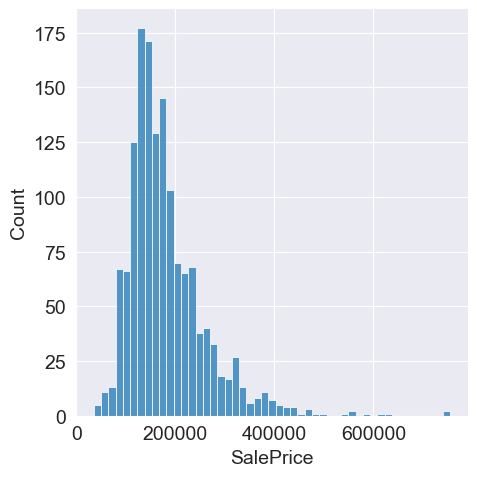

In [27]:
sns.displot(prices_df['SalePrice'])

In [26]:
px.histogram(prices_df,
            x='SalePrice',
            title='Sales Prices of Houses',
            color_discrete_sequence=['red'])

Mostly properties are in range from 100k to 250k

In [27]:
px.histogram(prices_df,
            x='Neighborhood',
            y='SalePrice',
            title='Sales Prices of Houses',
            color='BldgType')

In [28]:
fig = px.scatter(prices_df, 
                 x='TotalBsmtSF', 
                 y='SalePrice',  
                 opacity=0.8,  
                 title='Age vs. Charges')
fig.update_traces(marker_size=5)
fig.show()

We can see that basement area indeed may have good predictive power for the model.

In [29]:
prices_df.corr()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
Id,1.000000,0.011156,-0.003381,-0.033226,-0.028365,0.012609,-0.012713,-0.021998,-0.051071,-0.005024,...,-0.029643,-0.000477,0.002889,-0.046635,0.001330,0.057044,-0.006242,0.021172,0.000712,-0.021917
MSSubClass,0.011156,1.000000,-0.370367,-0.139781,0.032628,-0.059316,0.027850,0.040581,0.023573,-0.069836,...,-0.012579,-0.006100,-0.012037,-0.043825,-0.026030,0.008283,-0.007683,-0.013585,-0.021407,-0.084284
LotFrontage,-0.003381,-0.370367,1.000000,0.335957,0.239546,-0.043595,0.120999,0.084550,0.195830,0.232576,...,0.088736,0.141734,0.008057,0.064654,0.041063,0.174567,0.005332,0.007370,0.004756,0.349876
LotArea,-0.033226,-0.139781,0.335957,1.000000,0.105806,-0.005636,0.014228,0.013788,0.103321,0.214103,...,0.171698,0.084774,-0.018340,0.020423,0.043160,0.077672,0.038068,0.001205,-0.014261,0.263843
OverallQual,-0.028365,0.032628,0.239546,0.105806,1.000000,-0.091932,0.572323,0.550684,0.407252,0.239666,...,0.238923,0.308819,-0.113937,0.030371,0.064886,0.065166,-0.031406,0.070815,-0.027347,0.790982
OverallCond,0.012609,-0.059316,-0.043595,-0.005636,-0.091932,1.000000,-0.375983,0.073741,-0.125694,-0.046231,...,-0.003334,-0.032589,0.070356,0.025504,0.054811,-0.001985,0.068777,-0.003511,0.043950,-0.077856
YearBuilt,-0.012713,0.027850,0.120999,0.014228,0.572323,-0.375983,1.000000,0.592855,0.311600,0.249503,...,0.224880,0.188686,-0.387268,0.031355,-0.050364,0.004950,-0.034383,0.012398,-0.013618,0.522897
YearRemodAdd,-0.021998,0.040581,0.084550,0.013788,0.550684,0.073741,0.592855,1.000000,0.176529,0.128451,...,0.205726,0.226298,-0.193919,0.045286,-0.038740,0.005829,-0.010286,0.021490,0.035743,0.507101
MasVnrArea,-0.051071,0.023573,0.195830,0.103321,0.407252,-0.125694,0.311600,0.176529,1.000000,0.261256,...,0.159991,0.122528,-0.109907,0.019144,0.062248,0.011928,-0.029512,-0.006723,-0.008317,0.472614
BsmtFinSF1,-0.005024,-0.069836,0.232576,0.214103,0.239666,-0.046231,0.249503,0.128451,0.261256,1.000000,...,0.204306,0.111761,-0.102303,0.026451,0.062021,0.140491,0.003571,-0.015727,0.014359,0.386420


<AxesSubplot:>

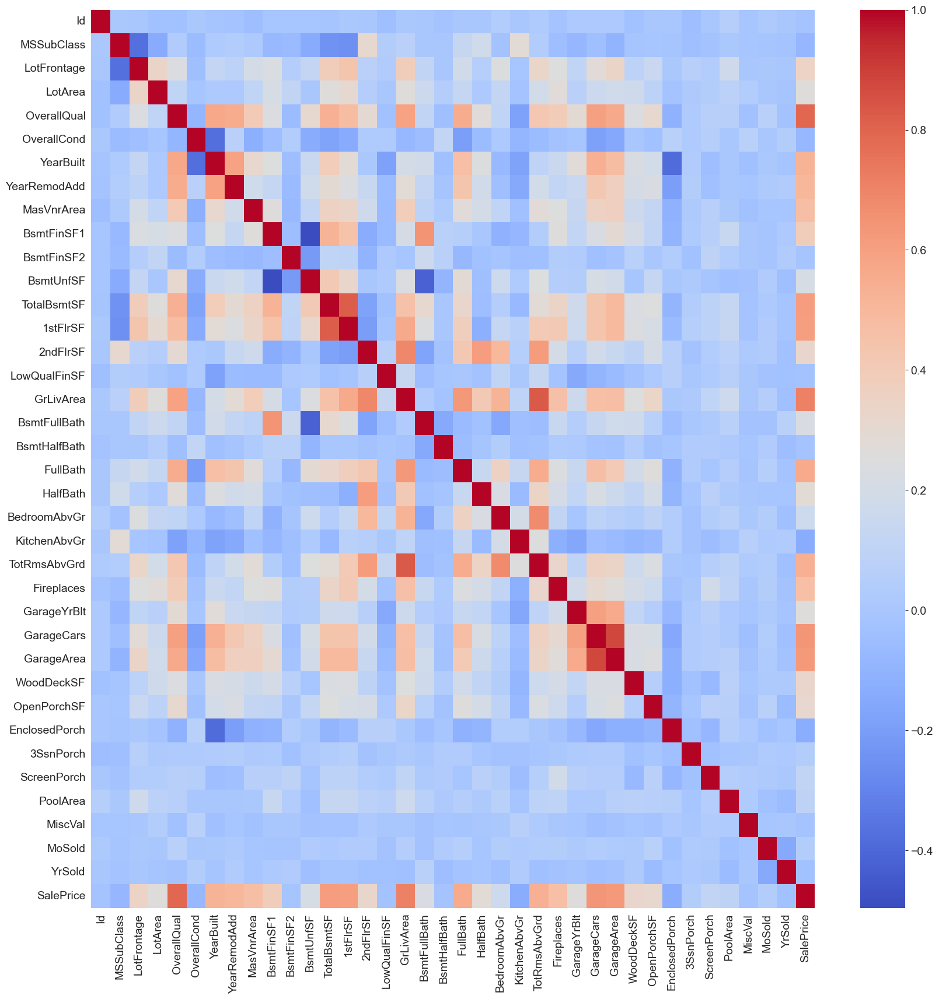

In [30]:
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(prices_df.corr(), cmap='coolwarm', ax=ax)

Let's find out top most correlelated features

In [31]:
top_correlations = prices_df.corr()
top_feature_columns = top_correlations['SalePrice'][top_correlations['SalePrice'].values > 0.3].index.values
top_feature_columns

array(['LotFrontage', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'SalePrice'], dtype=object)

In [32]:
# Create a new DataFrame with only the top feature columns
top_feature_df = prices_df[top_feature_columns]

# Calculate the correlation matrix
top_corr_matrix = top_feature_df.corr()

<AxesSubplot:>

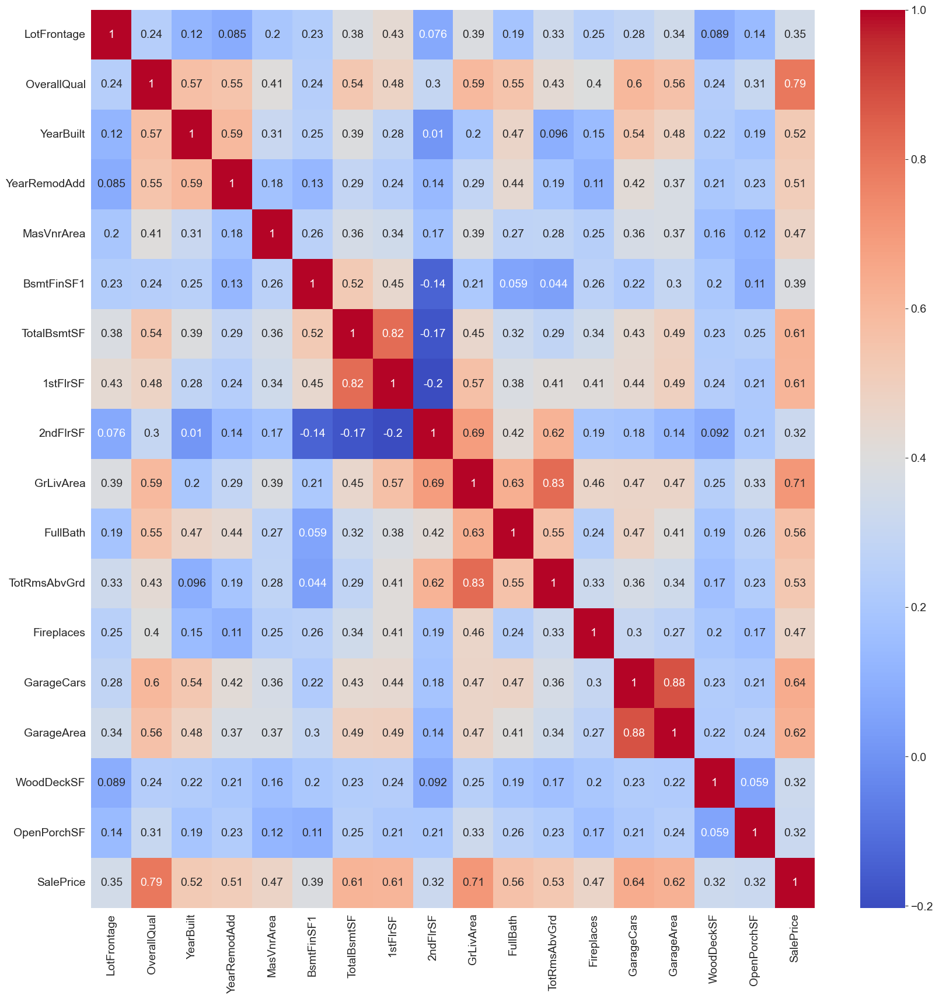

In [33]:
# Create a heatmap using Seaborn
fig, ax = plt.subplots(figsize=(20, 20))
sns.heatmap(top_corr_matrix, cmap='coolwarm', annot=True, ax=ax)

1. 'OverallQual', 'GrLivArea', and 'TotalBsmtSF' have strong correlation with 'SalePrice'.
2. While 'GarageCars' and 'GarageArea' also have strong correlation, but they are mostly mutually dependent i.e. they are NOT linearly independent of each other, i.e. there is a high-multicollinearity (0.88 as we can see in the figure) between them. Because, the number of cars that fit into the garage is dependent of the garage area. Hence, we just need one of these variables in our analysis (we can decide to keep 'GarageCars' as its correlation with 'SalePrice' is higher).
3. Same mutual dependence applies to the two features 'TotalBsmtSF' and '1stFloor' . We will take only 'TotalBsmtSF' in our feature-engineering.

Let's make pairplots of these top correlated features

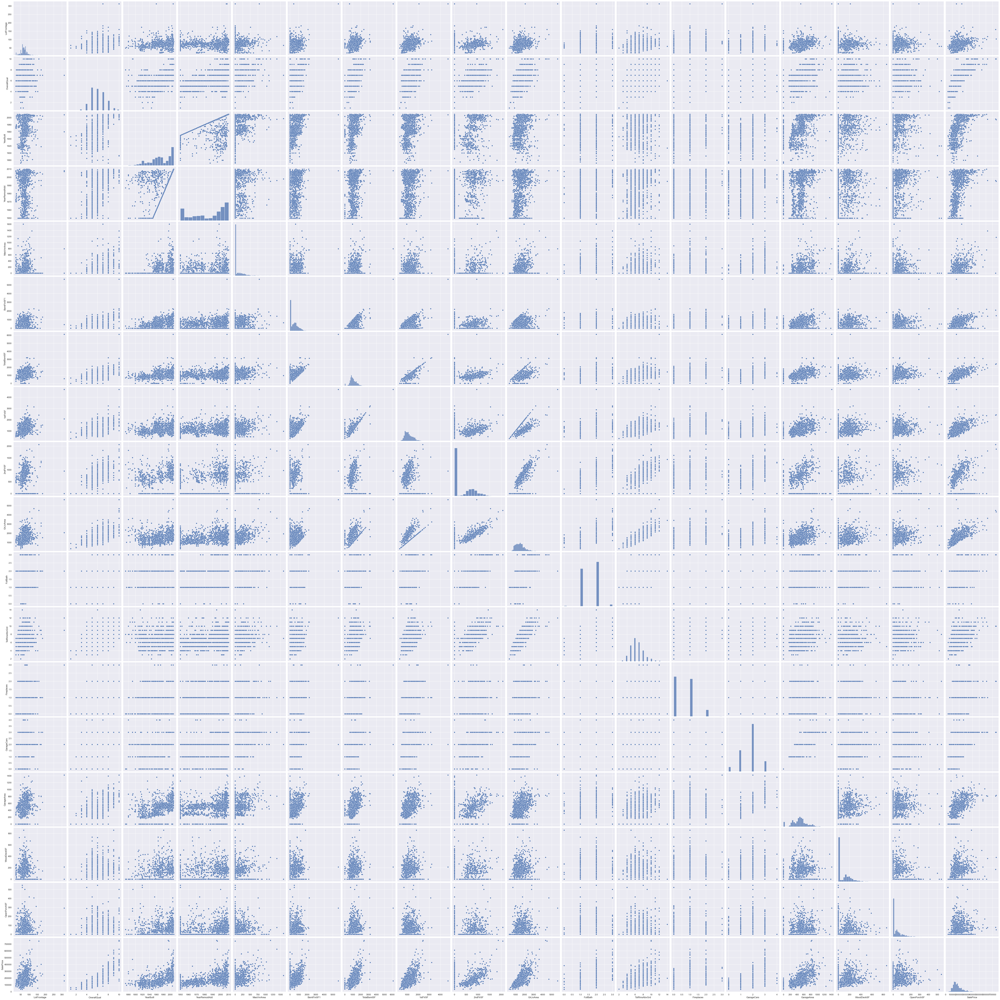

In [38]:
sns.set()
cols = ['LotFrontage', 'OverallQual', 'YearBuilt', 'YearRemodAdd',
       'MasVnrArea', 'BsmtFinSF1', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'GrLivArea', 'FullBath', 'TotRmsAbvGrd', 'Fireplaces',
       'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'SalePrice']
sns.pairplot(prices_df[cols], height=4)
plt.show()

# Prepare the Dataset for Training

### Identify Inputs and Targets

In [34]:
prices_df

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,unknown,unknown,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,unknown,unknown,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,unknown,IR1,Lvl,AllPub,...,0,unknown,unknown,unknown,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,unknown,IR1,Lvl,AllPub,...,0,unknown,unknown,unknown,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,unknown,IR1,Lvl,AllPub,...,0,unknown,unknown,unknown,0,12,2008,WD,Normal,250000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,1456,60,RL,62.0,7917,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,unknown,unknown,0,8,2007,WD,Normal,175000
1456,1457,20,RL,85.0,13175,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,MnPrv,unknown,0,2,2010,WD,Normal,210000
1457,1458,70,RL,66.0,9042,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,GdPrv,Shed,2500,5,2010,WD,Normal,266500
1458,1459,20,RL,68.0,9717,Pave,unknown,Reg,Lvl,AllPub,...,0,unknown,unknown,unknown,0,4,2010,WD,Normal,142125


In [35]:
# Identify the input columns (a list of column names)
input_cols = list(prices_df.columns[1:-1])

In [36]:
# Identify the name of the target column (a single string, not a list)
target_col = 'SalePrice'

In [37]:
print(list(input_cols))

['MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1', 'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional', 'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt', 'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'GarageCond', 'PavedDrive', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'PoolQC', 'Fen

In [38]:
len(input_cols)

79

Now that we've identified the input and target columns, we can separate input & target data.

In [39]:
inputs_df = prices_df[input_cols].copy()

In [40]:
targets = prices_df[target_col]

In [41]:
inputs_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,60,RL,65.0,8450,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0,0,unknown,unknown,unknown,0,2,2008,WD,Normal
1,20,RL,80.0,9600,Pave,unknown,Reg,Lvl,AllPub,FR2,...,0,0,unknown,unknown,unknown,0,5,2007,WD,Normal
2,60,RL,68.0,11250,Pave,unknown,IR1,Lvl,AllPub,Inside,...,0,0,unknown,unknown,unknown,0,9,2008,WD,Normal
3,70,RL,60.0,9550,Pave,unknown,IR1,Lvl,AllPub,Corner,...,0,0,unknown,unknown,unknown,0,2,2006,WD,Abnorml
4,60,RL,84.0,14260,Pave,unknown,IR1,Lvl,AllPub,FR2,...,0,0,unknown,unknown,unknown,0,12,2008,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,RL,62.0,7917,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0,0,unknown,unknown,unknown,0,8,2007,WD,Normal
1456,20,RL,85.0,13175,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0,0,unknown,MnPrv,unknown,0,2,2010,WD,Normal
1457,70,RL,66.0,9042,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0,0,unknown,GdPrv,Shed,2500,5,2010,WD,Normal
1458,20,RL,68.0,9717,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0,0,unknown,unknown,unknown,0,4,2010,WD,Normal


In [42]:
targets

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

# Identify Numeric and Categorical Data

In [43]:
numeric_input_cols = inputs_df.select_dtypes(include=np.number).columns.to_list()

In [44]:
categorical_input_cols = inputs_df.select_dtypes('object').columns.to_list()

In [45]:
inputs_df[numeric_input_cols]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,548,0,61,0,0,0,0,0,2,2008
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,460,298,0,0,0,0,0,0,5,2007
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,608,0,42,0,0,0,0,0,9,2008
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,642,0,35,272,0,0,0,0,2,2006
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,836,192,84,0,0,0,0,0,12,2008
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,62.0,7917,6,5,1999,2000,0.0,0,0,...,460,0,40,0,0,0,0,0,8,2007
1456,20,85.0,13175,6,6,1978,1988,119.0,790,163,...,500,349,0,0,0,0,0,0,2,2010
1457,70,66.0,9042,7,9,1941,2006,0.0,275,0,...,252,0,60,0,0,0,0,2500,5,2010
1458,20,68.0,9717,5,6,1950,1996,0.0,49,1029,...,240,366,0,112,0,0,0,0,4,2010


In [46]:
inputs_df[categorical_input_cols]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
1,RL,Pave,unknown,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
2,RL,Pave,unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
3,RL,Pave,unknown,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,unknown,unknown,unknown,WD,Abnorml
4,RL,Pave,unknown,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
1456,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Attchd,Unf,TA,TA,Y,unknown,MnPrv,unknown,WD,Normal
1457,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,...,Attchd,RFn,TA,TA,Y,unknown,GdPrv,Shed,WD,Normal
1458,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,unknown,unknown,unknown,WD,Normal


In [47]:
print(list(numeric_input_cols))

['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold']


In [48]:
print(list(categorical_input_cols))

['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition']


### Scale Numerical Values

The numeric columns in our dataset have varying ranges.

In [49]:
inputs_df[numeric_input_cols].describe().loc[['min', 'max']]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
min,20.0,21.0,1300.0,1.0,1.0,1872.0,1950.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,2006.0
max,190.0,313.0,215245.0,10.0,9.0,2010.0,2010.0,1600.0,5644.0,1474.0,...,1418.0,857.0,547.0,552.0,508.0,480.0,738.0,15500.0,12.0,2010.0


In [50]:
from sklearn.preprocessing import MinMaxScaler

In [51]:
scaler = MinMaxScaler()

In [52]:
scaler.fit(inputs_df[numeric_input_cols])

MinMaxScaler()

In [53]:
inputs_df[numeric_input_cols] = scaler.transform(inputs_df[numeric_input_cols])

In [54]:
inputs_df[numeric_input_cols].describe().loc[['min', 'max']]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0


In [55]:
inputs_df[numeric_input_cols]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,0.235294,0.150685,0.033420,0.666667,0.500,0.949275,0.883333,0.122500,0.125089,0.000000,...,0.386460,0.000000,0.111517,0.000000,0.0,0.0,0.0,0.00000,0.090909,0.50
1,0.000000,0.202055,0.038795,0.555556,0.875,0.753623,0.433333,0.000000,0.173281,0.000000,...,0.324401,0.347725,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.363636,0.25
2,0.235294,0.160959,0.046507,0.666667,0.500,0.934783,0.866667,0.101250,0.086109,0.000000,...,0.428773,0.000000,0.076782,0.000000,0.0,0.0,0.0,0.00000,0.727273,0.50
3,0.294118,0.133562,0.038561,0.666667,0.500,0.311594,0.333333,0.000000,0.038271,0.000000,...,0.452750,0.000000,0.063985,0.492754,0.0,0.0,0.0,0.00000,0.090909,0.00
4,0.235294,0.215753,0.060576,0.777778,0.500,0.927536,0.833333,0.218750,0.116052,0.000000,...,0.589563,0.224037,0.153565,0.000000,0.0,0.0,0.0,0.00000,1.000000,0.50
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.235294,0.140411,0.030929,0.555556,0.500,0.920290,0.833333,0.000000,0.000000,0.000000,...,0.324401,0.000000,0.073126,0.000000,0.0,0.0,0.0,0.00000,0.636364,0.25
1456,0.000000,0.219178,0.055505,0.555556,0.625,0.768116,0.633333,0.074375,0.139972,0.110583,...,0.352609,0.407235,0.000000,0.000000,0.0,0.0,0.0,0.00000,0.090909,1.00
1457,0.294118,0.154110,0.036187,0.666667,1.000,0.500000,0.933333,0.000000,0.048724,0.000000,...,0.177715,0.000000,0.109689,0.000000,0.0,0.0,0.0,0.16129,0.363636,1.00
1458,0.000000,0.160959,0.039342,0.444444,0.625,0.565217,0.766667,0.000000,0.008682,0.698100,...,0.169252,0.427071,0.000000,0.202899,0.0,0.0,0.0,0.00000,0.272727,1.00


### Encode Categorical Columns

In [56]:
inputs_df[categorical_input_cols]

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
0,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
1,RL,Pave,unknown,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
2,RL,Pave,unknown,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
3,RL,Pave,unknown,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,...,Detchd,Unf,TA,TA,Y,unknown,unknown,unknown,WD,Abnorml
4,RL,Pave,unknown,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,...,Attchd,RFn,TA,TA,Y,unknown,unknown,unknown,WD,Normal
1456,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,...,Attchd,Unf,TA,TA,Y,unknown,MnPrv,unknown,WD,Normal
1457,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,...,Attchd,RFn,TA,TA,Y,unknown,GdPrv,Shed,WD,Normal
1458,RL,Pave,unknown,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,...,Attchd,Unf,TA,TA,Y,unknown,unknown,unknown,WD,Normal


In [57]:
from sklearn.preprocessing import OneHotEncoder

In [58]:
# 1. Create the encoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [59]:
# 2. Fit the encoder to the categorical colums
encoder.fit(inputs_df[categorical_input_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [60]:
# 3. Generate column names for each category
encoded_cols = list(encoder.get_feature_names(categorical_input_cols))

C:\Users\user\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



In [61]:
print(encoded_cols)

['MSZoning_C (all)', 'MSZoning_FV', 'MSZoning_RH', 'MSZoning_RL', 'MSZoning_RM', 'Street_Grvl', 'Street_Pave', 'Alley_Grvl', 'Alley_Pave', 'Alley_unknown', 'LotShape_IR1', 'LotShape_IR2', 'LotShape_IR3', 'LotShape_Reg', 'LandContour_Bnk', 'LandContour_HLS', 'LandContour_Low', 'LandContour_Lvl', 'Utilities_AllPub', 'Utilities_NoSeWa', 'LotConfig_Corner', 'LotConfig_CulDSac', 'LotConfig_FR2', 'LotConfig_FR3', 'LotConfig_Inside', 'LandSlope_Gtl', 'LandSlope_Mod', 'LandSlope_Sev', 'Neighborhood_Blmngtn', 'Neighborhood_Blueste', 'Neighborhood_BrDale', 'Neighborhood_BrkSide', 'Neighborhood_ClearCr', 'Neighborhood_CollgCr', 'Neighborhood_Crawfor', 'Neighborhood_Edwards', 'Neighborhood_Gilbert', 'Neighborhood_IDOTRR', 'Neighborhood_MeadowV', 'Neighborhood_Mitchel', 'Neighborhood_NAmes', 'Neighborhood_NPkVill', 'Neighborhood_NWAmes', 'Neighborhood_NoRidge', 'Neighborhood_NridgHt', 'Neighborhood_OldTown', 'Neighborhood_SWISU', 'Neighborhood_Sawyer', 'Neighborhood_SawyerW', 'Neighborhood_Somerst'

In [62]:
len(encoded_cols)

268

In [63]:
inputs_df[encoded_cols] = encoder.transform(inputs_df[categorical_input_cols])

C:\Users\user\AppData\Local\Temp\ipykernel_13604\3471102814.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\user\AppData\Local\Temp\ipykernel_13604\3471102814.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`

C:\Users\user\AppData\Local\Temp\ipykernel_13604\3471102814.py:1: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented fra

In [64]:
inputs_df[encoded_cols]

,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,Alley_unknown,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1456,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1457,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1458,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [65]:
inputs_df[numeric_input_cols + encoded_cols]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.235294,0.150685,0.033420,0.666667,0.500,0.949275,0.883333,0.122500,0.125089,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.000000,0.202055,0.038795,0.555556,0.875,0.753623,0.433333,0.000000,0.173281,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.235294,0.160959,0.046507,0.666667,0.500,0.934783,0.866667,0.101250,0.086109,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.294118,0.133562,0.038561,0.666667,0.500,0.311594,0.333333,0.000000,0.038271,0.000000,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.235294,0.215753,0.060576,0.777778,0.500,0.927536,0.833333,0.218750,0.116052,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.235294,0.140411,0.030929,0.555556,0.500,0.920290,0.833333,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1456,0.000000,0.219178,0.055505,0.555556,0.625,0.768116,0.633333,0.074375,0.139972,0.110583,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1457,0.294118,0.154110,0.036187,0.666667,1.000,0.500000,0.933333,0.000000,0.048724,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1458,0.000000,0.160959,0.039342,0.444444,0.625,0.565217,0.766667,0.000000,0.008682,0.698100,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [66]:
inputs_df

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
0,0.235294,RL,0.150685,0.033420,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1,0.000000,RL,0.202055,0.038795,Pave,unknown,Reg,Lvl,AllPub,FR2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
2,0.235294,RL,0.160959,0.046507,Pave,unknown,IR1,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,0.294118,RL,0.133562,0.038561,Pave,unknown,IR1,Lvl,AllPub,Corner,...,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0
4,0.235294,RL,0.215753,0.060576,Pave,unknown,IR1,Lvl,AllPub,FR2,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,0.235294,RL,0.140411,0.030929,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1456,0.000000,RL,0.219178,0.055505,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1457,0.294118,RL,0.154110,0.036187,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1458,0.000000,RL,0.160959,0.039342,Pave,unknown,Reg,Lvl,AllPub,Inside,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


Both values of scalled numerical columns and encoded categorical columns have been added to inputs_df

### Training and Validation Set

Finally, let's split the dataset into a training and validation set. We'll use a randomly select 25% subset of the data for validation. Also, we'll use just the numeric and encoded columns, since the inputs to our model must be numbers.

In [67]:
from sklearn.model_selection import train_test_split

In [68]:
train_inputs, val_inputs, train_targets, val_targets = train_test_split(inputs_df[numeric_input_cols + encoded_cols], targets,
                                                                       test_size=0.25, random_state=42)

In [69]:
train_inputs

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
1023,0.588235,0.075342,0.008797,0.666667,0.500,0.963768,0.933333,0.008750,0.002835,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
810,0.000000,0.195205,0.041319,0.555556,0.625,0.739130,0.816667,0.061875,0.117470,0.255767,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1384,0.176471,0.133562,0.036271,0.555556,0.500,0.485507,0.000000,0.000000,0.036145,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
626,0.000000,0.178082,0.051611,0.444444,0.500,0.637681,0.466667,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
813,0.000000,0.184932,0.039496,0.555556,0.625,0.623188,0.133333,0.151875,0.107725,0.000000,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1095,0.000000,0.195205,0.037472,0.555556,0.500,0.971014,0.933333,0.000000,0.004252,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1130,0.176471,0.150685,0.030400,0.333333,0.250,0.405797,0.000000,0.000000,0.110206,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1294,0.000000,0.133562,0.032120,0.444444,0.750,0.601449,0.666667,0.000000,0.029589,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
860,0.176471,0.116438,0.029643,0.666667,0.875,0.333333,0.800000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [70]:
val_inputs

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,SaleType_ConLw,SaleType_New,SaleType_Oth,SaleType_WD,SaleCondition_Abnorml,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial
892,0.000000,0.167808,0.033252,0.555556,0.875,0.659420,0.883333,0.000000,0.117470,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1105,0.235294,0.263699,0.051209,0.777778,0.500,0.884058,0.750000,0.226250,0.182849,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
413,0.058824,0.119863,0.035804,0.444444,0.625,0.398551,0.000000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
522,0.176471,0.099315,0.017294,0.555556,0.750,0.543478,0.000000,0.000000,0.070695,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1036,0.000000,0.232877,0.054210,0.888889,0.500,0.978261,0.966667,0.043750,0.181077,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
988,0.235294,0.202055,0.050228,0.555556,0.625,0.753623,0.433333,0.186250,0.027640,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
243,0.823529,0.184932,0.044226,0.555556,0.625,0.782609,0.500000,0.000000,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1342,0.235294,0.167808,0.037743,0.777778,0.500,0.942029,0.866667,0.093125,0.000000,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
1057,0.235294,0.239726,0.133955,0.666667,0.625,0.884058,0.733333,0.000000,0.105422,0.000000,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0


In [71]:
train_targets

1023    191000
810     181000
1384    105000
626     139900
813     157900
         ...  
1095    176432
1130    135000
1294    115000
860     189950
1126    174000
Name: SalePrice, Length: 1095, dtype: int64

In [72]:
val_targets

892     154500
1105    325000
413     115000
522     159000
1036    315500
         ...  
988     195000
243     120000
1342    228500
1057    248000
1418    124000
Name: SalePrice, Length: 365, dtype: int64

# Train a Linear Regression Model

In [73]:
from sklearn.linear_model import Ridge

In [74]:
model = Ridge(alpha=50, max_iter=100, tol=0.1)

In [75]:
model.fit(train_inputs, train_targets)

Ridge(alpha=50, max_iter=100, tol=0.1)

# Make Predictions and Evaluate Your Model

In [101]:
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score

In [77]:
train_preds = model.predict(train_inputs)

In [78]:
train_preds

array([190557.78864197, 185035.67745909, 114583.45034239, ...,
       124569.03182399, 188404.78720131, 200926.34463282])

In [79]:
len(train_preds)

1095

In [80]:
mse = mean_squared_error(train_targets, train_preds)
train_rmse = np.sqrt(mse)
print("Train RMSE: ", train_rmse)

Train RMSE:  31057.780644058992


In [81]:
train_r2 = r2_score(train_targets, train_preds)
print('Train R2 score: ', train_r2)

Train R2 score:  0.8411274881385038


In [82]:
val_preds = model.predict(val_inputs)
val_preds

array([152220.01431493, 313179.8151343 ,  97097.41673308, 161264.90909406,
       347994.38658031,  74231.62424495, 224464.48095714, 154465.08645707,
        70922.5944119 , 132161.28257367, 144785.01177338, 112200.21264446,
       124421.10439785, 216621.44553694, 179914.52751313, 128674.48413998,
       207431.20005624, 131860.04781251, 134479.47940526, 208201.5626193 ,
       168855.77765958, 196321.02509154, 202274.71454566, 128846.35275906,
       205105.72179837, 165192.53915225, 213131.5002195 , 103339.23371992,
       184054.98162588, 215988.28456556, 135566.2474651 , 264664.12034508,
       201178.56792028, 105551.37031048, 250678.24115675, 141867.22813917,
       125962.27840588, 216993.02369556, 280782.93974815, 109204.35142972,
       140069.02023635, 231157.70121618, 107149.21395676, 338462.30202579,
       139568.28579027, 149188.99185422, 115302.65255594, 122597.29996998,
       390804.09456822, 123013.38201398, 110558.48251832, 221183.51626166,
       143906.97641462, 2

In [83]:
len(val_preds)

365

In [84]:
mse = mean_squared_error(val_targets, val_preds)
val_rmse = np.sqrt(mse)
print("Val RMSE: ", val_rmse)

Val RMSE:  35448.01515015852


In [85]:
coefficient = model.coef_
print('coefficient: ', coefficient)

coefficient:  [-6.78776620e+03  2.56479353e+03  5.26000461e+03  2.27767095e+04
  7.45535592e+03  2.68491664e+03  1.02642334e+04  8.20326802e+03
  6.26724951e+03  1.46750117e+03  8.61910770e+03  9.43857423e+03
  1.42016741e+04  1.94042073e+04  3.12524314e+03  1.95456336e+04
  8.72285372e+03 -2.24843011e+03  1.85456962e+04  8.89316736e+03
  8.53113745e+03 -1.59337130e+02  2.07726125e+04  1.06998911e+04
  1.48607247e+03  1.91462961e+04  1.54064699e+04  9.52290719e+03
  3.42730463e+03 -1.40791481e+01  1.85306195e+03  6.66288214e+03
  2.95678226e+03 -1.24951949e+02  7.86816591e+02 -2.04048895e+03
 -2.05646632e+03  1.52422594e+03  1.14369716e+03  4.40593098e+03
 -5.01738776e+03 -3.31943285e+02  3.31943285e+02 -1.41327550e+03
  2.13301083e+03 -7.19735325e+02 -1.13415278e+03  7.28131330e+03
 -2.63333696e+03 -3.51382355e+03 -7.26870270e+03  6.38333943e+03
  1.04166096e+03 -1.56297697e+02  7.42010653e+02 -7.42010653e+02
 -1.05736958e+03  8.65179022e+03 -4.65600170e+03 -6.99241107e+02
 -2.2391778

In [86]:
#calculatin the intercept
intercept = model.intercept_
print('intercept: ', intercept)

intercept:  107948.71683993982


In [87]:
val_r2 = r2_score(val_targets, val_preds)
print('Val R2 score: ', val_r2)

Val R2 score:  0.8206272173436435


# Feature Importance

Let's look at the weights assigned to different columns, to figure out which columns in the dataset are the most important.

Let's create a dataframe to view the weight assigned to each column.

In [88]:
weights_df = pd.DataFrame({
    'columns': train_inputs.columns,
    'weight': coefficient
}).sort_values('weight', ascending=False)

In [89]:
weights_df

,columns,weight
3,OverallQual,22776.709549
184,BsmtQual_Ex,22439.203385
232,KitchenQual_Ex,21354.143065
22,TotRmsAbvGrd,20772.612520
79,Neighborhood_NoRidge,20151.067009
...,...,...
248,FireplaceQu_unknown,-10163.972475
72,Neighborhood_Gilbert,-10564.996023
172,ExterQual_TA,-10688.797834
71,Neighborhood_Edwards,-12144.003429


# Decision Tree

In [90]:
from sklearn.tree import DecisionTreeRegressor

In [91]:
model = DecisionTreeRegressor(random_state=42)

In [92]:
model.fit(train_inputs, train_targets)

DecisionTreeRegressor(random_state=42)

## Make Predictions and Evaluate Your Model

In [93]:
tree_train_preds = model.predict(train_inputs)
tree_train_preds

array([191000., 181000., 105000., ..., 115000., 189950., 174000.])

In [94]:
len(tree_train_preds)

1095

In [95]:
tree_train_mse = mean_squared_error(train_targets, tree_train_preds)
tree_train_rmse = np.sqrt(tree_train_mse)
print("Train RMSE: ", tree_train_rmse)

Train RMSE:  0.0


In [96]:
tree_train_r2 = r2_score(train_targets, tree_train_preds)
print('Train R2 score: ', tree_train_r2)

Train R2 score:  1.0


In [97]:
tree_val_preds = model.predict(val_inputs)
tree_val_preds

array([154000., 424870., 109900., 133000., 325000.,  82500., 170000.,
       148500.,  82500., 167500., 189950., 125500., 107000., 159895.,
       172400., 133700., 215000., 119000., 108000., 214000., 149900.,
       287090., 174000., 130500., 230000., 186000., 222000., 103000.,
       173000., 250580., 112500., 226000., 189000.,  97000., 250000.,
       160000.,  91500., 215000., 290000., 106500., 116000., 222500.,
       133500., 440000., 149000., 136000., 105000., 125500., 466500.,
       133900., 127000., 179200.,  94500., 423000., 136500., 171000.,
       190000., 160000., 138000., 120000.,  60000., 164500., 354000.,
       325000., 249700., 230000., 110000., 325624., 123600., 127000.,
       118964.,  99900., 110000., 102000., 501837., 179200., 290000.,
       260000., 148000., 125000.,  83000.,  76000., 118000.,  87000.,
       163000., 135000., 270000., 170000., 131500., 200141., 137900.,
       161750., 158000., 294000., 115000., 186000., 129900., 148800.,
       279500., 2225

In [98]:
tree_val_mse = mean_squared_error(val_targets, tree_val_preds)
tree_val_rmse = np.sqrt(tree_val_mse)
print("Val RMSE: ", tree_val_rmse)

Val RMSE:  37452.94165139056


In [99]:
tree_val_r2 = r2_score(val_targets, tree_val_preds)
print('Val R2 score: ', tree_val_r2)

Val R2 score:  0.7997628901362964


### This model is overfitting due to hige difference of accuracy between train set and val set

## Visualization

In [103]:
from sklearn.tree import plot_tree, export_text

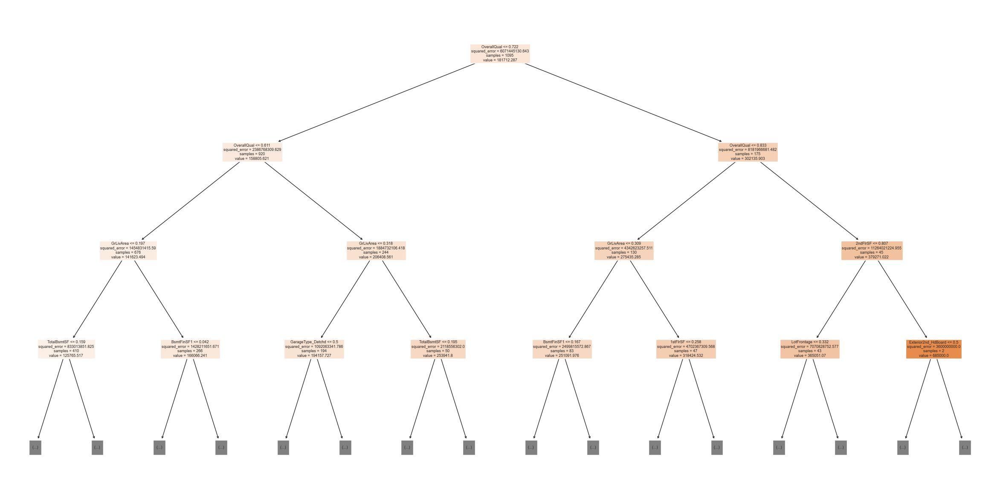

In [105]:
plt.figure(figsize=(30,15))
plot_tree(model, feature_names=train_inputs.columns, max_depth=3, filled=True);

In [106]:
model.tree_.max_depth

22

We can also display the tree as text, which can be easier to follow for deeper trees.

In [107]:
tree_text = export_text(model, max_depth=10, feature_names=list(train_inputs.columns))
# Display the first few lines
print(tree_text[:2000])

|--- OverallQual <= 0.72
|   |--- OverallQual <= 0.61
|   |   |--- GrLivArea <= 0.20
|   |   |   |--- TotalBsmtSF <= 0.16
|   |   |   |   |--- OverallQual <= 0.39
|   |   |   |   |   |--- GarageCond_TA <= 0.50
|   |   |   |   |   |   |--- LotArea <= 0.04
|   |   |   |   |   |   |   |--- CentralAir_Y <= 0.50
|   |   |   |   |   |   |   |   |--- YearBuilt <= 0.54
|   |   |   |   |   |   |   |   |   |--- SaleCondition_Abnorml <= 0.50
|   |   |   |   |   |   |   |   |   |   |--- Neighborhood_BrkSide <= 0.50
|   |   |   |   |   |   |   |   |   |   |   |--- truncated branch of depth 3
|   |   |   |   |   |   |   |   |   |   |--- Neighborhood_BrkSide >  0.50
|   |   |   |   |   |   |   |   |   |   |   |--- value: [39300.00]
|   |   |   |   |   |   |   |   |   |--- SaleCondition_Abnorml >  0.50
|   |   |   |   |   |   |   |   |   |   |--- 2ndFlrSF <= 0.09
|   |   |   |   |   |   |   |   |   |   |   |--- value: [34900.00]
|   |   |   |   |   |   |   |   |   |   |--- 2ndFlrSF >  0.09
|   |   |  

## Feature Importance 

Based on the gini index computations, a decision tree assigns an "importance" value to each feature. These values can be used to interpret the results given by a decision tree.

In [109]:
tree_importances = model.feature_importances_
tree_importances

array([4.16859367e-04, 1.80608122e-02, 7.72808464e-03, 6.32362393e-01,
       4.76767795e-03, 1.19088973e-02, 3.39468037e-03, 1.55216775e-03,
       2.60828658e-02, 4.62187102e-06, 3.65609431e-03, 3.07326374e-02,
       2.60748058e-02, 3.26362413e-02, 0.00000000e+00, 1.05767647e-01,
       8.08185177e-05, 1.42322820e-04, 1.39445690e-04, 5.56614114e-06,
       2.09730349e-03, 0.00000000e+00, 9.20122717e-04, 5.35167038e-04,
       3.31942720e-03, 4.76256934e-03, 1.03872725e-02, 4.65102287e-03,
       6.98321805e-03, 1.57991943e-04, 0.00000000e+00, 3.09227518e-03,
       9.19718824e-05, 1.33882704e-05, 8.16910728e-03, 5.72784365e-04,
       0.00000000e+00, 6.32498946e-07, 0.00000000e+00, 3.08723791e-05,
       7.61830666e-05, 0.00000000e+00, 0.00000000e+00, 2.07869789e-04,
       1.20365498e-04, 1.85663385e-05, 4.05112106e-04, 1.20332737e-06,
       0.00000000e+00, 6.09122397e-05, 0.00000000e+00, 8.93853257e-06,
       0.00000000e+00, 1.36367387e-05, 0.00000000e+00, 0.00000000e+00,
      

Let's turn this into a dataframe and visualize the most important features.

In [110]:
tree_importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': tree_importances
}).sort_values('importance', ascending=False)

In [111]:
tree_importance_df

,feature,importance
3,OverallQual,0.632362
15,GrLivArea,0.105768
13,2ndFlrSF,0.032636
11,TotalBsmtSF,0.030733
8,BsmtFinSF1,0.026083
...,...,...
121,RoofStyle_Gambrel,0.000000
123,RoofStyle_Mansard,0.000000
208,BsmtFinType2_GLQ,0.000000
124,RoofStyle_Shed,0.000000


<AxesSubplot:title={'center':'Decision Tree Feature Importance'}, xlabel='importance', ylabel='feature'>

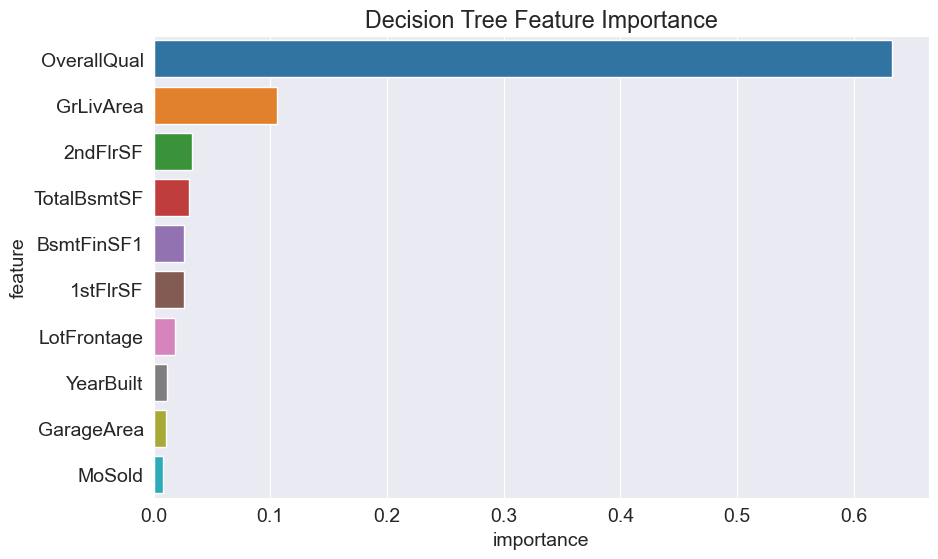

In [113]:
plt.title('Decision Tree Feature Importance')
sns.barplot(data=tree_importance_df.head(10), x='importance', y='feature')

# Hyperparameter Tuning

In [115]:
?DecisionTreeRegressor

In [141]:
model = DecisionTreeRegressor(max_depth= 5 , random_state=42)

In [142]:
model.fit(train_inputs, train_targets)

DecisionTreeRegressor(max_depth=5, random_state=42)

In [143]:
tree_train_preds = model.predict(train_inputs)
tree_train_preds

array([180236.72      , 147456.21518987, 120735.8045977 , ...,
       120735.8045977 , 160264.08      , 180236.72      ])

In [144]:
model.score(train_inputs, train_targets)

0.8655439260320896

In [145]:
model.score(val_inputs, val_targets)

0.7990040453818632

In [146]:
tree_train_mse = mean_squared_error(train_targets, tree_train_preds)
tree_train_rmse = np.sqrt(tree_train_mse)
print("Train RMSE: ", tree_train_rmse)

Train RMSE:  28571.711106929328


In [147]:
tree_train_r2 = r2_score(train_targets, tree_train_preds)
print('Train R2 score: ', tree_train_r2)

Train R2 score:  0.8655439260320896


In [148]:
tree_val_preds = model.predict(val_inputs)

In [149]:
tree_val_mse = mean_squared_error(val_targets, tree_val_preds)
tree_val_rmse = np.sqrt(tree_val_mse)
print("Val RMSE: ", tree_val_rmse)

Val RMSE:  37523.84282519604


In [150]:
tree_val_r2 = r2_score(val_targets, tree_val_preds)
print('Val R2 score: ', tree_val_r2)

Val R2 score:  0.7990040453818632


### Let's experiment with different depths using a helper function.

In [153]:
def max_depth_error(md):
    model = DecisionTreeRegressor(max_depth=md, random_state=42)
    model.fit(train_inputs, train_targets)
    train_acc = 1 - model.score(train_inputs, train_targets)
    val_acc = 1 - model.score(val_inputs, val_targets)
    return {'Max Depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [154]:
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1, 21)])

In [155]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,5.456595e-01,0.547325
1,2,3.782603e-01,0.338686
2,3,2.675854e-01,0.227796
3,4,1.933242e-01,0.211138
4,5,1.344561e-01,0.200996
5,6,8.684284e-02,0.204678
6,7,5.434577e-02,0.201864
7,8,3.094339e-02,0.183055
8,9,1.720529e-02,0.176439
9,10,1.015245e-02,0.181373


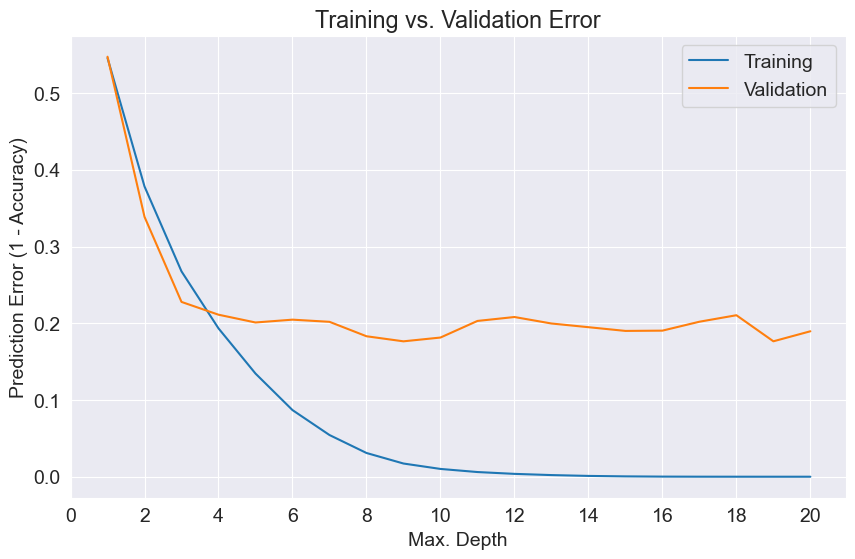

In [156]:
plt.figure()
plt.plot(errors_df['Max Depth'], errors_df['Training Error'])
plt.plot(errors_df['Max Depth'], errors_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(0,21, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation'])

In [165]:
model = DecisionTreeRegressor(max_depth=4, random_state=42).fit(train_inputs, train_targets)
train_acc = model.score(train_inputs, train_targets)
val_acc = model.score(val_inputs, val_targets)
print(train_acc)
print(val_acc)

0.8066757748641139
0.7888624647139008


### Here, while using Hyperparameter Tuning, we countered overfitting to significant level, now we will train Random Forest model for even much better results

# Random Forests

In [166]:
from sklearn.ensemble import RandomForestRegressor

In [167]:
rf1 = RandomForestRegressor(n_jobs=-1, random_state=42)

In [168]:
rf1.fit(train_inputs, train_targets)

RandomForestRegressor(n_jobs=-1, random_state=42)

In [169]:
rf1.score(train_inputs, train_targets)

0.9772641917728263

In [170]:
rf1.score(val_inputs, val_targets)

0.8910414568431182

Validation accuracy has been increased for this dataset, comparing to Decision Tree models

In [172]:
rf1_train_preds = rf1.predict(train_inputs)
rf1_train_preds

array([191284.7 , 172797.  , 106687.  , ..., 116339.83, 179431.  ,
       181278.55])

In [173]:
rf1_train_mse = mean_squared_error(train_targets, rf1_train_preds)
rf1_train_rmse = np.sqrt(rf1_train_mse)
print("Train RMSE: ", rf1_train_rmse)

Train RMSE:  11749.008985957236


In [175]:
rf1_val_preds = rf1.predict(val_inputs)

In [177]:
rf1_val_mse = mean_squared_error(val_targets, rf1_val_preds)
rf1_val_rmse = np.sqrt(rf1_val_mse)
print("Val RMSE: ", rf1_val_rmse)

Val RMSE:  27627.672155044278


In [178]:
print('Train RMSE: {}, Validation RMSE: {}'.format(rf1_train_rmse, rf1_val_rmse))

Train RMSE: 11749.008985957236, Validation RMSE: 27627.672155044278


## Hyperparameter Tuning 

Let's define a helper function test_params which can test the given value of one or more hyperparameters.



In [179]:
def test_params(**params):
    model = RandomForestRegressor(random_state=42, n_jobs=-1, **params).fit(train_inputs, train_targets)
    train_rmse = mean_squared_error(model.predict(train_inputs), train_targets, squared=False)
    val_rmse = mean_squared_error(model.predict(val_inputs), val_targets, squared=False)
    return train_rmse, val_rmse

In [180]:
test_params(n_estimators=20, max_depth=20)

(12552.586790415984, 28986.95732342296)

In [181]:
test_params(n_estimators=50, max_depth=10, min_samples_leaf=4, max_features=0.4)

(20000.162501427054, 29125.08306767302)

In [182]:
def test_param_and_plot(param_name, param_values):
    train_errors, val_errors = [], [] 
    for value in param_values:
        params = {param_name: value}
        train_rmse, val_rmse = test_params(**params)
        train_errors.append(train_rmse)
        val_errors.append(val_rmse)
    plt.figure(figsize=(10,6))
    plt.title('Overfitting curve: ' + param_name)
    plt.plot(param_values, train_errors, 'b-o')
    plt.plot(param_values, val_errors, 'r-o')
    plt.xlabel(param_name)
    plt.ylabel('RMSE')
    plt.legend(['Training', 'Validation'])

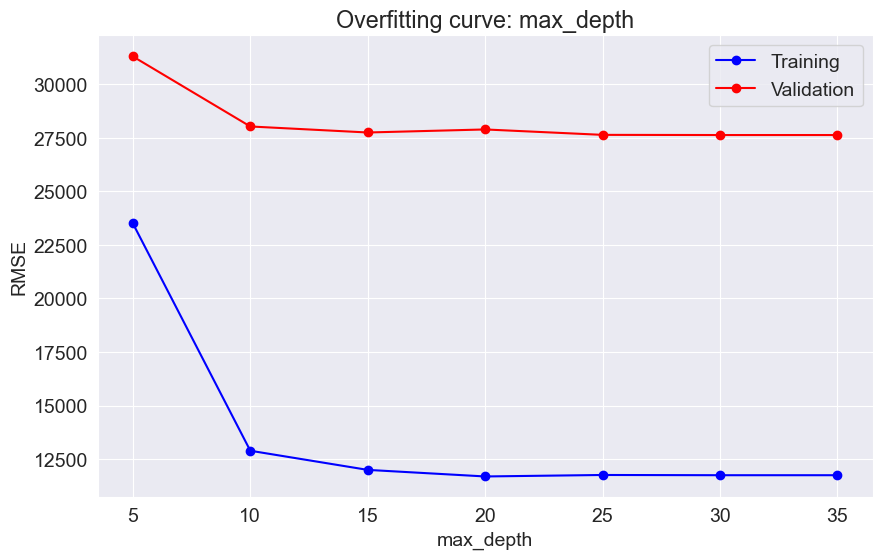

In [185]:
test_param_and_plot('max_depth', [5, 10, 15, 20, 25, 30, 35])

From the above graph, it appears that the best value for `max_depth` is around 20, beyond which the model starts to overfit.

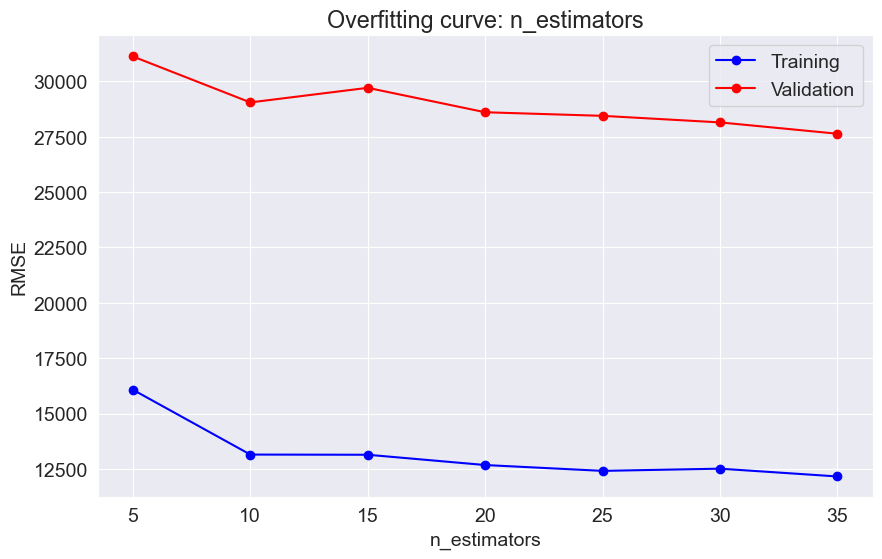

In [186]:
test_param_and_plot('n_estimators', [5, 10, 15, 20, 25, 30, 35])

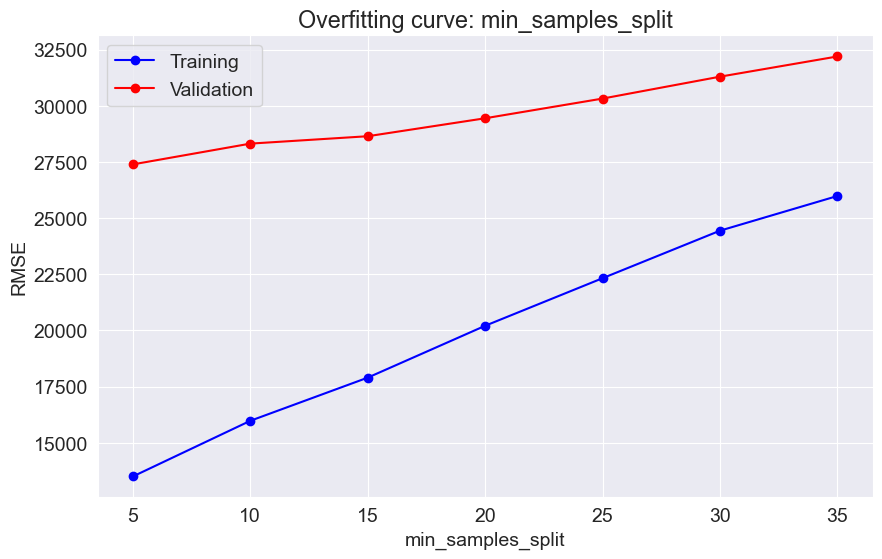

In [187]:
test_param_and_plot('min_samples_split', [5, 10, 15, 20, 25, 30, 35])

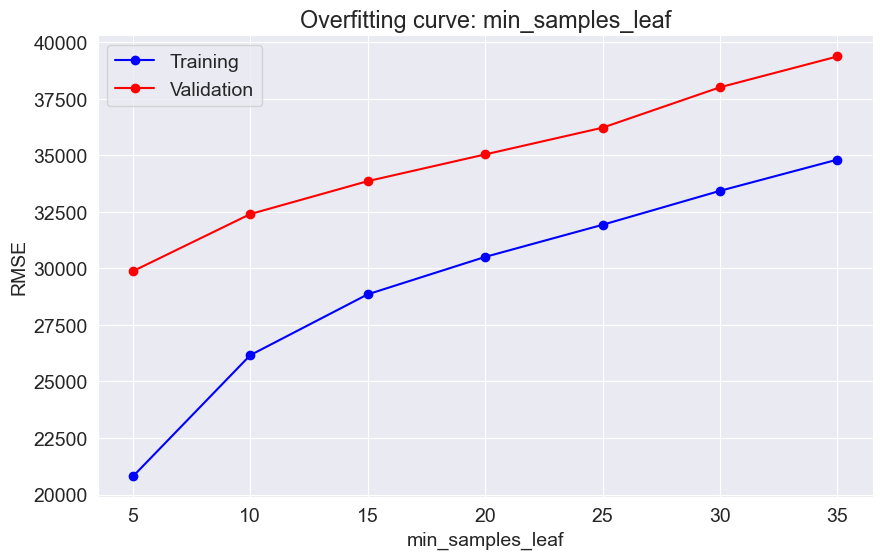

In [188]:
test_param_and_plot('min_samples_leaf', [5, 10, 15, 20, 25, 30, 35])

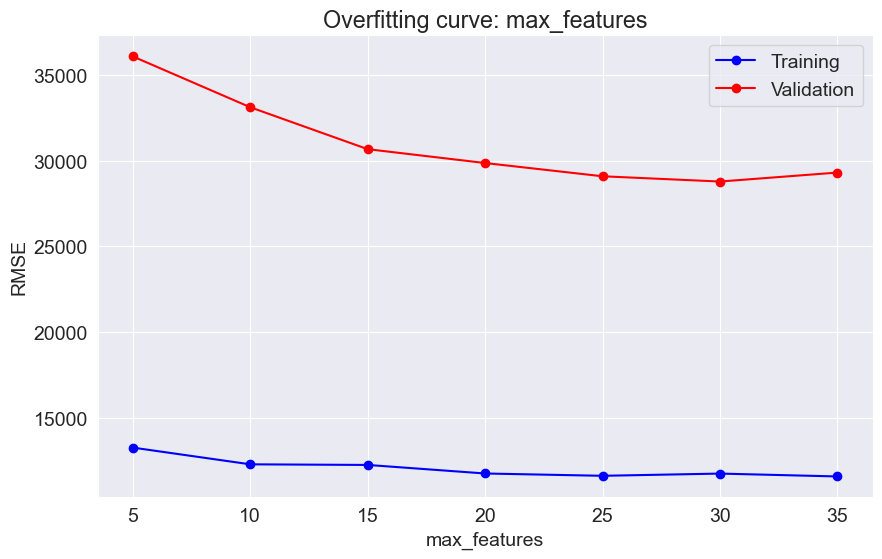

In [190]:
test_param_and_plot('max_features', [5, 10, 15, 20, 25, 30, 35])

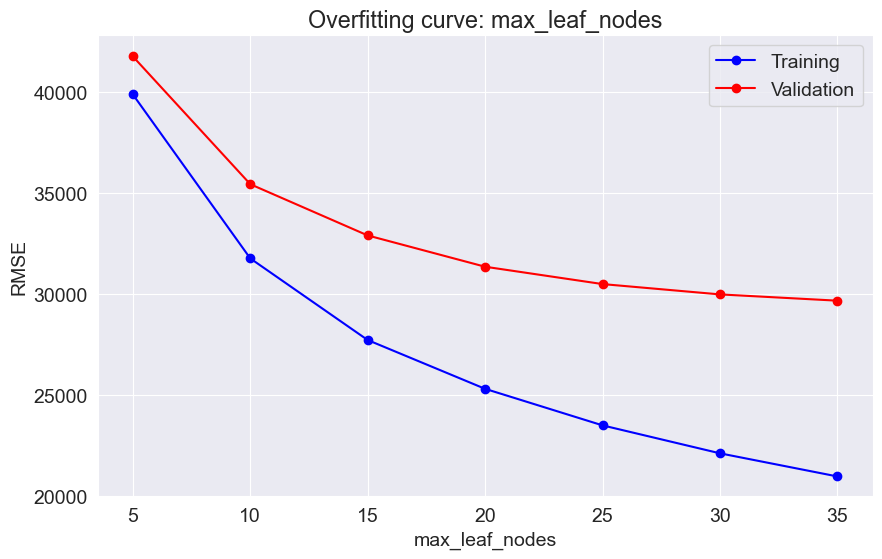

In [191]:
test_param_and_plot('max_leaf_nodes', [5, 10, 15, 20, 25, 30, 35])

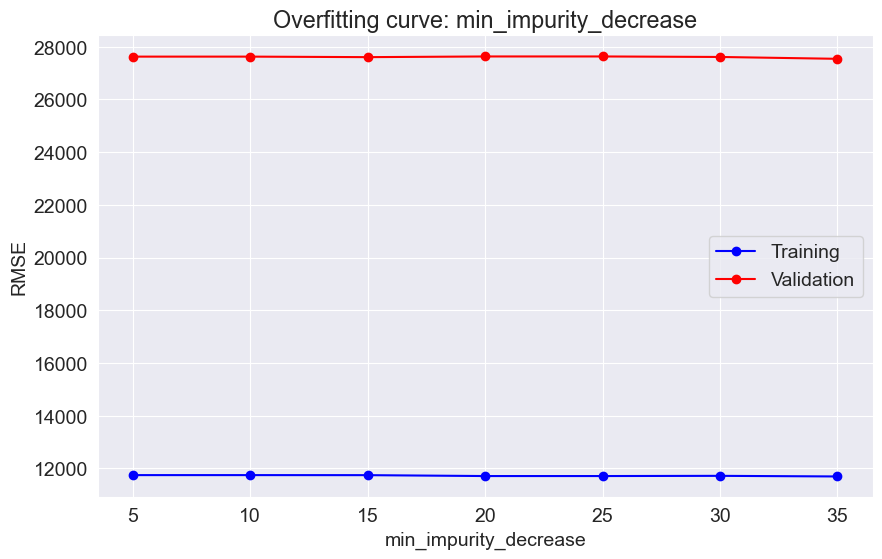

In [192]:
test_param_and_plot('min_impurity_decrease', [5, 10, 15, 20, 25, 30, 35])

## Training the Best Model

In [265]:
# Create the model with custom hyperparameters
rf2 = RandomForestRegressor(n_jobs=-1, random_state=42, max_depth=20, n_estimators=50, min_samples_split=25, 
                           min_samples_leaf=3, max_features=20, max_leaf_nodes=15)

In [266]:
rf2.fit(train_inputs, train_targets)

RandomForestRegressor(max_depth=20, max_features=20, max_leaf_nodes=15,
                      min_samples_leaf=3, min_samples_split=25, n_estimators=50,
                      n_jobs=-1, random_state=42)

In [267]:
rf2.score(train_inputs, train_targets), rf2.score(val_inputs, val_targets)

(0.8141586427593852, 0.796718586476376)

In [269]:
rf2_train_preds = rf2.predict(train_inputs)
rf2_train_preds

array([206081.39566181, 161131.91753898, 123935.59542109, ...,
       131108.2084161 , 163201.35284828, 215088.68752764])

In [272]:
rf2_train_mse = mean_squared_error(train_targets, rf2_train_preds)
rf2_train_rmse = np.sqrt(rf2_train_mse)
print("Train RMSE: ", rf2_train_rmse)

Train RMSE:  33590.558249165726


In [274]:
rf2_val_preds = rf2.predict(val_inputs)

In [275]:
rf2_val_mse = mean_squared_error(val_targets, rf2_val_preds)
rf2_val_rmse = np.sqrt(rf2_val_mse)
print("Val RMSE: ", rf2_val_rmse)

Val RMSE:  37736.57544517489


In [276]:
print('Train RMSE: {}, Validation RMSE: {}'.format(rf2_train_rmse, rf2_val_rmse))

Train RMSE: 33590.558249165726, Validation RMSE: 37736.57544517489


## Feature Importance 

In [277]:
rf2_importance_df = pd.DataFrame({
    'feature': train_inputs.columns,
    'importance': rf2.feature_importances_
}).sort_values('importance', ascending=False)

In [278]:
rf2_importance_df

,feature,importance
25,GarageCars,0.114761
3,OverallQual,0.096395
15,GrLivArea,0.062549
12,1stFlrSF,0.056557
184,BsmtQual_Ex,0.051383
...,...,...
148,Exterior2nd_AsbShng,0.000000
149,Exterior2nd_AsphShn,0.000000
150,Exterior2nd_Brk Cmn,0.000000
151,Exterior2nd_BrkFace,0.000000


<AxesSubplot:xlabel='importance', ylabel='feature'>

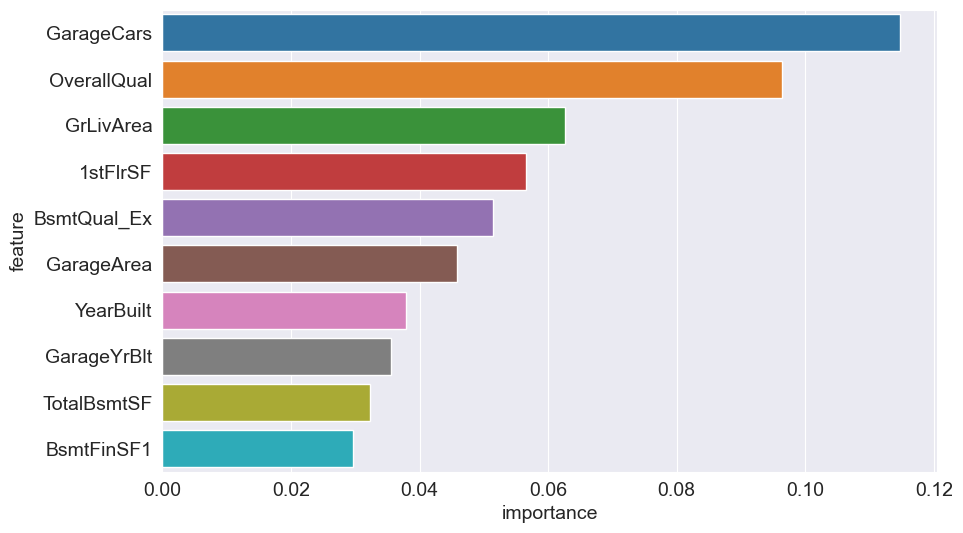

In [281]:
sns.barplot(data=rf2_importance_df.head(10), x='importance', y='feature')